In [1]:
%pip install -qq opencv-python-headless
%pip install -qq matplotlib
%pip install -qq numpy
%pip install -qq git+https://github.com/udesa-vision/i308-utils.git

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from i308_utils import show_images, imshow

from pipeline.preprocessing import load_images_from_folder
from pipeline.features import detect_features, anms
from pipeline.matching import match_descriptors, draw_matches
from pipeline.homography_manual import show_manual_matches_and_compute_H
from pipeline.ransac import ransac_homography
from pipeline.stitching import stitch_images_with_blending

## Cargamos las Imágenes

In [3]:
# Cargar todas las imágenes
images_color, images_gray, resize_factors = load_images_from_folder("img", target_width=1500)

In [4]:
# Imágenes udesa (son las últimas 3)
img0_udesa, img1_udesa, img2_udesa = images_color[3:6]
gray0_udesa, gray1_udesa, gray2_udesa = images_gray[3:6]
resize_factor_udesa = resize_factors[3:6]

# Imágenes cuadro (son las primeras 3)
img0_cuadro, img1_cuadro, img2_cuadro = images_color[0:3]
gray0_cuadro, gray1_cuadro, gray2_cuadro = images_gray[0:3]
resize_factor_cuadro = resize_factors[0:3]

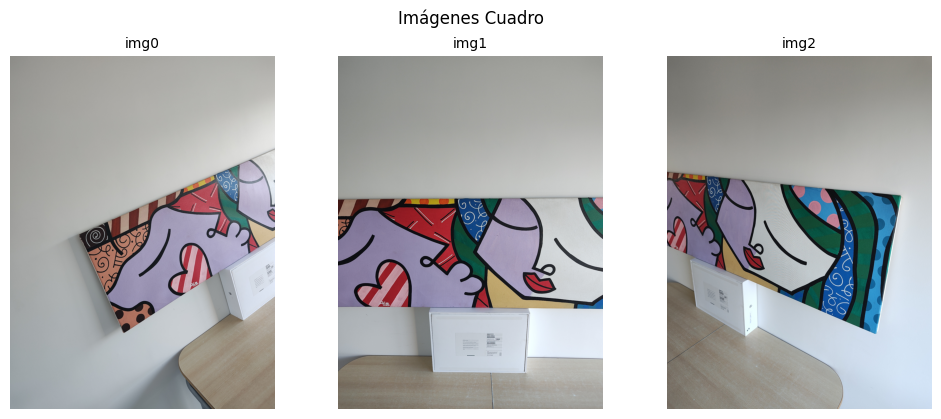

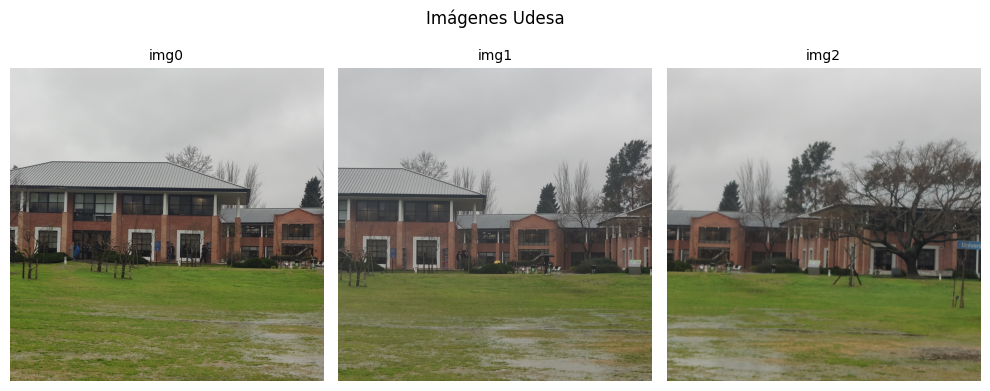

In [5]:
show_images([img0_cuadro, img1_cuadro, img2_cuadro], ['img0', 'img1', 'img2'], title='Imágenes Cuadro')
show_images([img0_udesa, img1_udesa, img2_udesa], ['img0', 'img1', 'img2'], title='Imágenes Udesa')

# 1) Detección y descripción de características

### Detectamos características en ambos conjuntos de imágenes usando SIFT

In [6]:
# Aplicar detector SIFT: keypoints + descriptores
kp0_udesa, desc0_udesa = detect_features(gray0_udesa)
kp1_udesa, desc1_udesa = detect_features(gray1_udesa)
kp2_udesa, desc2_udesa = detect_features(gray2_udesa)

kp0_cuadro, desc0_cuadro = detect_features(gray0_cuadro)
kp1_cuadro, desc1_cuadro = detect_features(gray1_cuadro)
kp2_cuadro, desc2_cuadro = detect_features(gray2_cuadro)


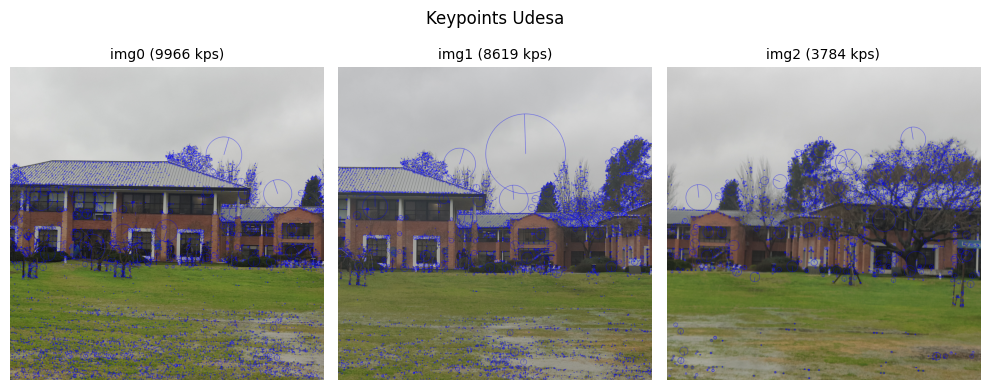

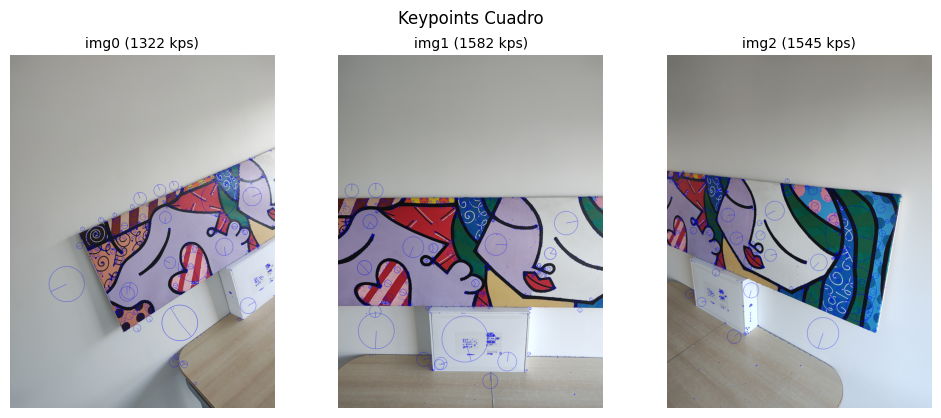

In [7]:
# Visualizar keypoints
img0_kp_udesa = cv2.drawKeypoints(img0_udesa, kp0_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_udesa = cv2.drawKeypoints(img1_udesa, kp1_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_udesa = cv2.drawKeypoints(img2_udesa, kp2_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img0_kp_cuadro = cv2.drawKeypoints(img0_cuadro, kp0_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_cuadro = cv2.drawKeypoints(img1_cuadro, kp1_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_cuadro = cv2.drawKeypoints(img2_cuadro, kp2_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([img0_kp_udesa, img1_kp_udesa, img2_kp_udesa], 
            [f'img0 ({len(kp0_udesa)} kps)', f'img1 ({len(kp1_udesa)} kps)', f'img2 ({len(kp2_udesa)} kps)'],
            title='Keypoints Udesa')

show_images([img0_kp_cuadro, img1_kp_cuadro, img2_kp_cuadro], 
            [f'img0 ({len(kp0_cuadro)} kps)', f'img1 ({len(kp1_cuadro)} kps)', f'img2 ({len(kp2_cuadro)} kps)'],
            title='Keypoints Cuadro')

# 2) Adaptive non-maximal suppression

### Aplicamos ANMS para obtener los N keypoints mejor distribuidos

In [8]:
kp0_udesa, desc0_udesa = anms(kp0_udesa, desc0_udesa, N=600)
kp1_udesa, desc1_udesa = anms(kp1_udesa, desc1_udesa, N=600)
kp2_udesa, desc2_udesa = anms(kp2_udesa, desc2_udesa, N=600)

kp0_cuadro, desc0_cuadro = anms(kp0_cuadro, desc0_cuadro, N=600)
kp1_cuadro, desc1_cuadro = anms(kp1_cuadro, desc1_cuadro, N=600)
kp2_cuadro, desc2_cuadro = anms(kp2_cuadro, desc2_cuadro, N=600)

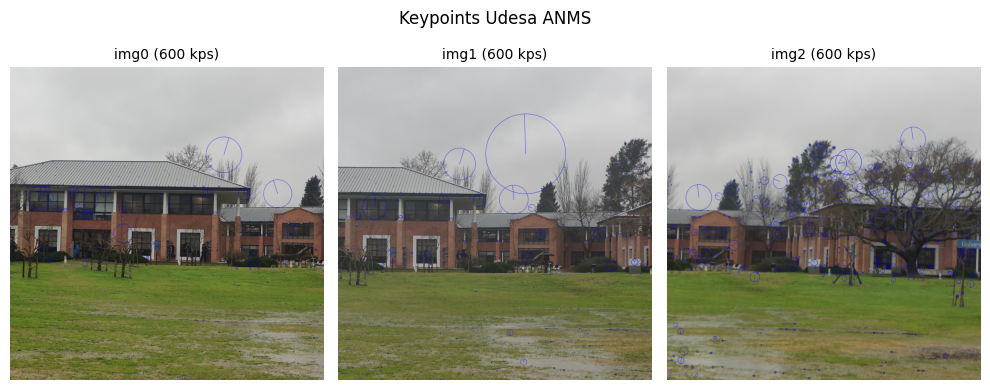

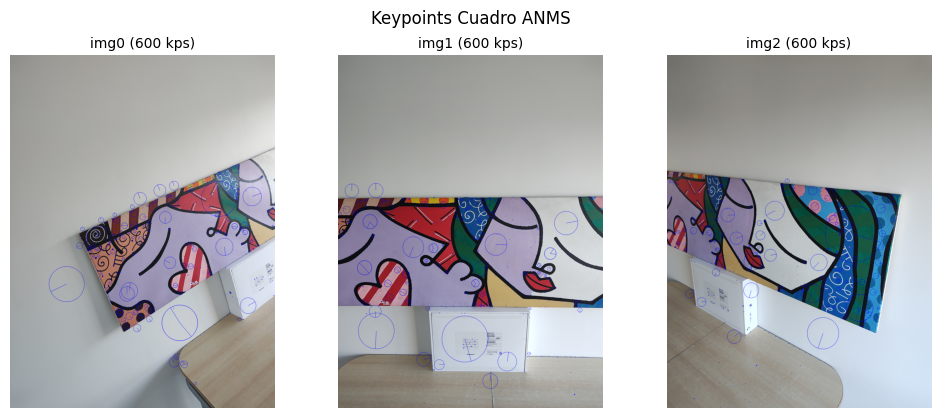

In [9]:
# Visualizar keypoints
img0_kp_udesa = cv2.drawKeypoints(img0_udesa, kp0_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_udesa = cv2.drawKeypoints(img1_udesa, kp1_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_udesa = cv2.drawKeypoints(img2_udesa, kp2_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img0_kp_cuadro = cv2.drawKeypoints(img0_cuadro, kp0_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_cuadro = cv2.drawKeypoints(img1_cuadro, kp1_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_cuadro = cv2.drawKeypoints(img2_cuadro, kp2_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([img0_kp_udesa, img1_kp_udesa, img2_kp_udesa], 
            [f'img0 ({len(kp0_udesa)} kps)', f'img1 ({len(kp1_udesa)} kps)', f'img2 ({len(kp2_udesa)} kps)'],
            title='Keypoints Udesa ANMS')
show_images([img0_kp_cuadro, img1_kp_cuadro, img2_kp_cuadro], 
            [f'img0 ({len(kp0_cuadro)} kps)', f'img1 ({len(kp1_cuadro)} kps)', f'img2 ({len(kp2_cuadro)} kps)'],
            title='Keypoints Cuadro ANMS')

# 3) Asociación de características

### Asociamos las características de las imagenes usando Brute Force con distintos filtros: Lowe Ratio Test, Cross Check, y ambos juntos

### Lowe Ratio test

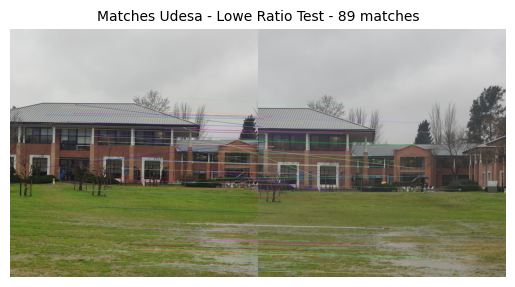

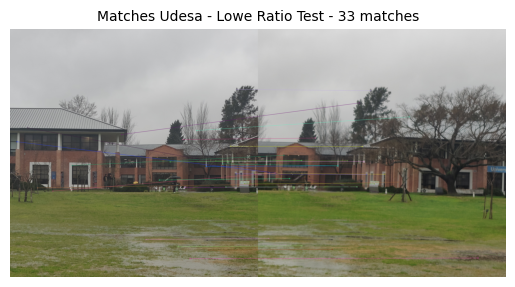

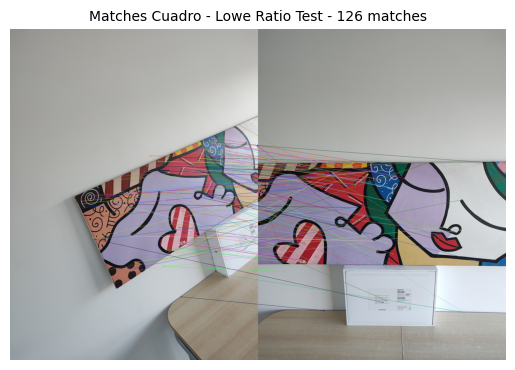

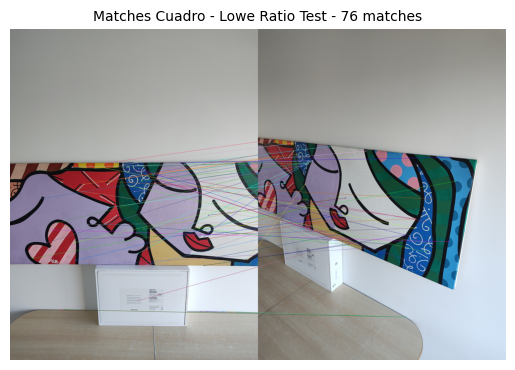

In [10]:
matches_01_udesa = match_descriptors(desc0_udesa, desc1_udesa, method='lowe', ratio_thresh=0.75)
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, matches_01_udesa, title='Matches Udesa - Lowe Ratio Test')

matches_12_udesa = match_descriptors(desc1_udesa, desc2_udesa, method='lowe', ratio_thresh=0.75)
draw_matches(img1_udesa, kp1_udesa, img2_udesa, kp2_udesa, matches_12_udesa, title='Matches Udesa - Lowe Ratio Test')

matches_01_cuadro = match_descriptors(desc0_cuadro, desc1_cuadro, method='lowe', ratio_thresh=0.75)
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, matches_01_cuadro, title='Matches Cuadro - Lowe Ratio Test')

matches_12_cuadro = match_descriptors(desc1_cuadro, desc2_cuadro, method='lowe', ratio_thresh=0.75)
draw_matches(img1_cuadro, kp1_cuadro, img2_cuadro, kp2_cuadro, matches_12_cuadro, title='Matches Cuadro - Lowe Ratio Test')

### Cross check

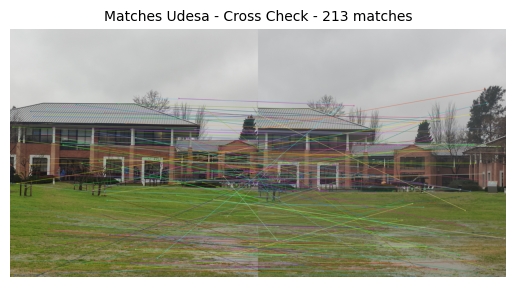

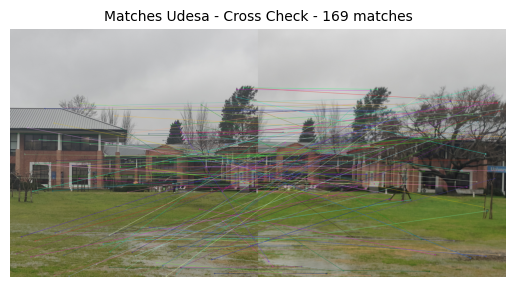

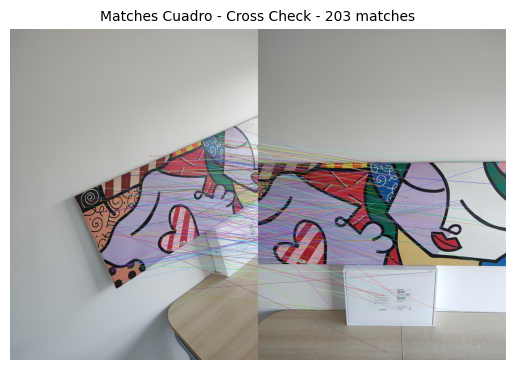

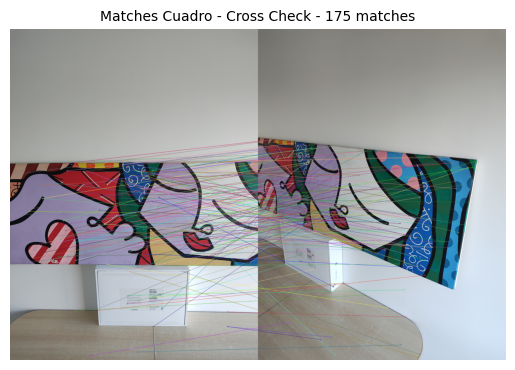

In [11]:
matches_01_cross_udesa = match_descriptors(desc0_udesa, desc1_udesa, method='cross_check')
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, matches_01_cross_udesa, title='Matches Udesa - Cross Check')

matches_12_cross_udesa = match_descriptors(desc1_udesa, desc2_udesa, method='cross_check')
draw_matches(img1_udesa, kp1_udesa, img2_udesa, kp2_udesa, matches_12_cross_udesa, title='Matches Udesa - Cross Check')

matches_01_cross_cuadro = match_descriptors(desc0_cuadro, desc1_cuadro, method='cross_check')
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, matches_01_cross_cuadro, title='Matches Cuadro - Cross Check')

matches_12_cross_cuadro = match_descriptors(desc1_cuadro, desc2_cuadro, method='cross_check')
draw_matches(img1_cuadro, kp1_cuadro, img2_cuadro, kp2_cuadro, matches_12_cross_cuadro, title='Matches Cuadro - Cross Check')

### Ambos métodos juntos

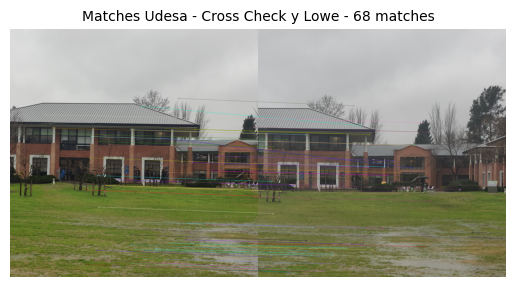

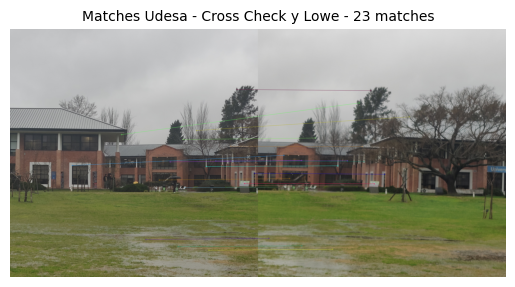

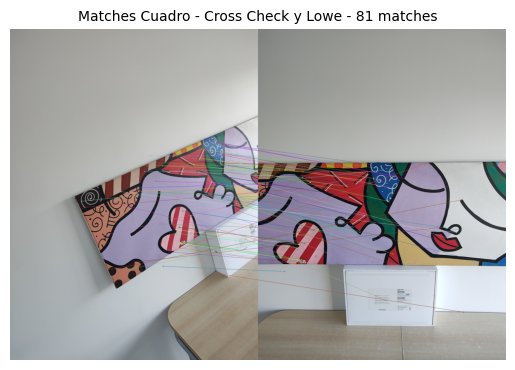

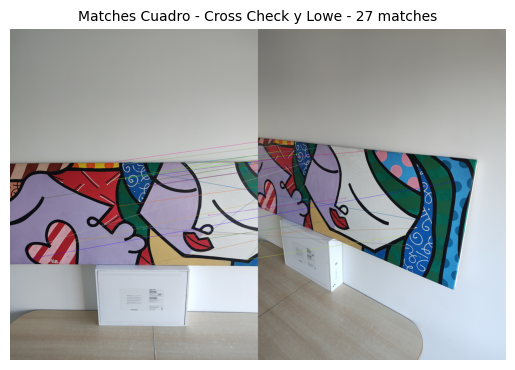

In [12]:
matches_01_cross_y_lowe_udesa = match_descriptors(desc0_udesa, desc1_udesa, method='cross_check_and_lowe')
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, matches_01_cross_y_lowe_udesa, title='Matches Udesa - Cross Check y Lowe')

matches_12_cross_y_lowe_udesa = match_descriptors(desc1_udesa, desc2_udesa, method='cross_check_and_lowe')
draw_matches(img1_udesa, kp1_udesa, img2_udesa, kp2_udesa, matches_12_cross_y_lowe_udesa, title='Matches Udesa - Cross Check y Lowe')

matches_01_cross_y_lowe_cuadro = match_descriptors(desc0_cuadro, desc1_cuadro, method='cross_check_and_lowe')
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, matches_01_cross_y_lowe_cuadro, title='Matches Cuadro - Cross Check y Lowe')

matches_12_cross_y_lowe_cuadro = match_descriptors(desc1_cuadro, desc2_cuadro, method='cross_check_and_lowe')
draw_matches(img1_cuadro, kp1_cuadro, img2_cuadro, kp2_cuadro, matches_12_cross_y_lowe_cuadro, title='Matches Cuadro - Cross Check y Lowe')

Se nota visualmente que usar ambos métodos juntos descarta una cantidad mucho mayor de 'malas' correspondencias que usar cualquiera de los métodos por separado. Por otro lado no queda claro si también en este proceso descarta más correspondencias 'buenas', pero consideramos que funcionó mejor usar ambos juntos en base a prueba y error.

# 4) Estimación manual de la homografía

### Aplicamos DLT para estimar manualmente una Homografía con 4 pares de puntos seleccionados manualmente

In [13]:
matches_manual_udesa_01 = {
    "image0": [[1508,915],[1131,1549],[2852,1351],[2516,1764],],
    "image1": [[619,972],[239,1616],[1965,1406],[1641,1818],]
}

matches_manual_udesa_21 = {
    "image2": [[508,1400],[152,1741],[1494,1916],[1351,1407],],
    "image1": [[1909,1420],[1581,1768],[2923,1911],[2754,1400],]
}

matches_manual_cuadro_01 = {
    "image0": [[1609, 1942],[2776, 1218],[1981, 2783],[2893, 2210],],
    "image1": [[147, 1896],[2109, 1654],[315, 2908],[1796, 2919],]
}

matches_manual_cuadro_21 = {
    "image2": [[61, 1451],[26, 2207],[1460, 1548],[1319, 2709],],
    "image1": [[460, 1799],[315, 2908],[2967, 1691],[2782, 2881],]
}

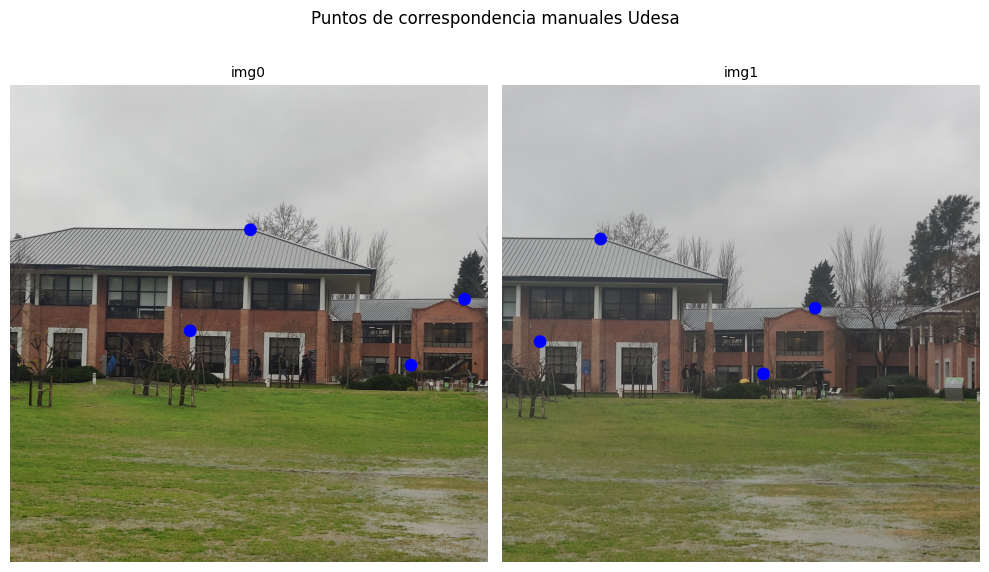

Homografía manual entre img0 y img1:
[[ 1.05890334e+00  1.17002498e-02 -4.86125859e+02]
 [ 2.04374615e-02  1.03550589e+00  9.62843516e+00]
 [ 3.61929779e-05 -2.16094762e-06  1.00000000e+00]]


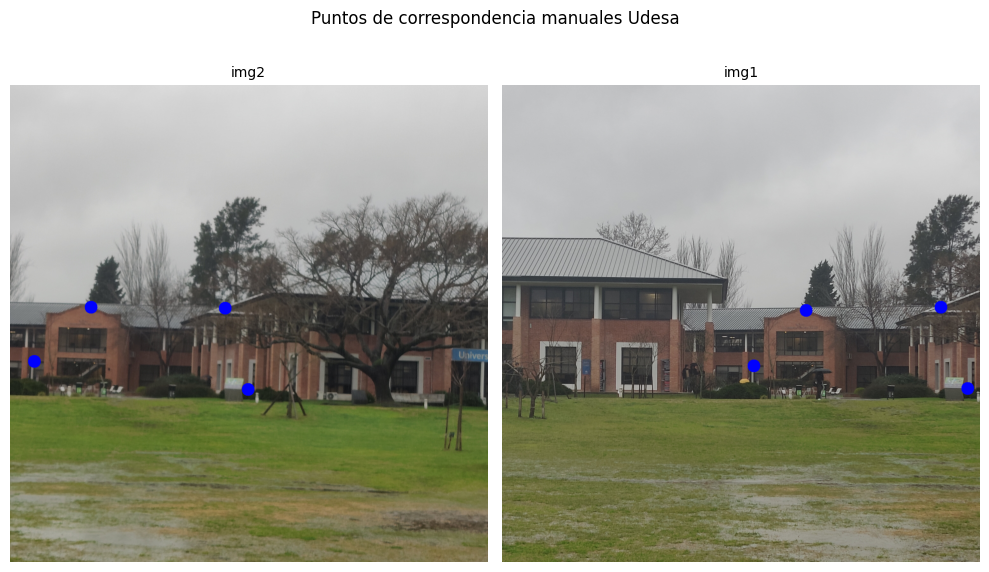

Homografía manual entre img2 y img1:
[[ 9.52549867e-01  7.85153635e-02  6.63466288e+02]
 [-6.04864955e-02  1.02165733e+00  1.45733132e+01]
 [-4.03835020e-05  2.34459416e-05  1.00000000e+00]]


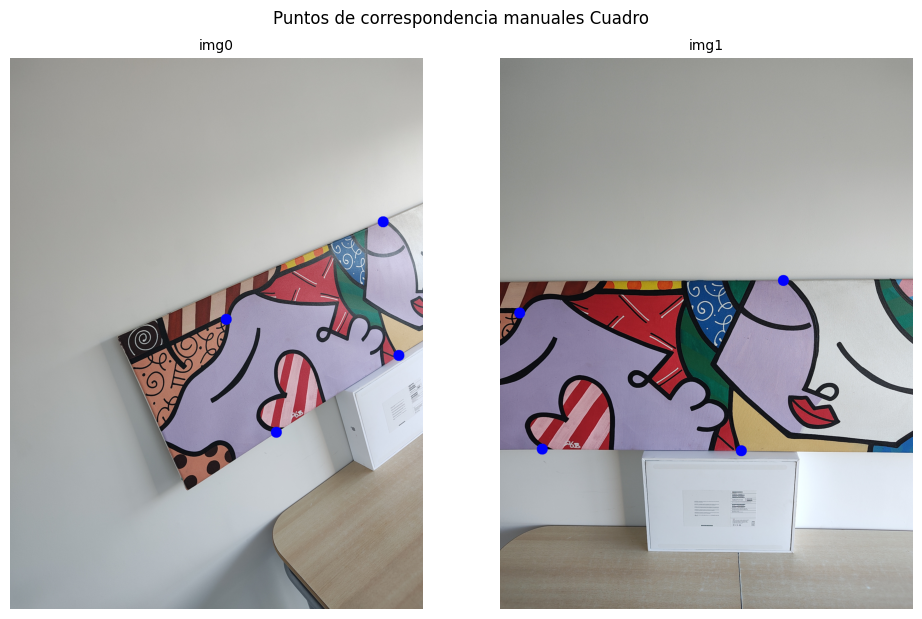

Homografía manual entre img0 y img1:
[[ 1.02016244e+00 -2.68389051e-01 -4.81618394e+02]
 [ 1.77516886e-01  1.02598616e+00 -2.69224070e+02]
 [-2.59515274e-04  1.20858863e-04  1.00000000e+00]]


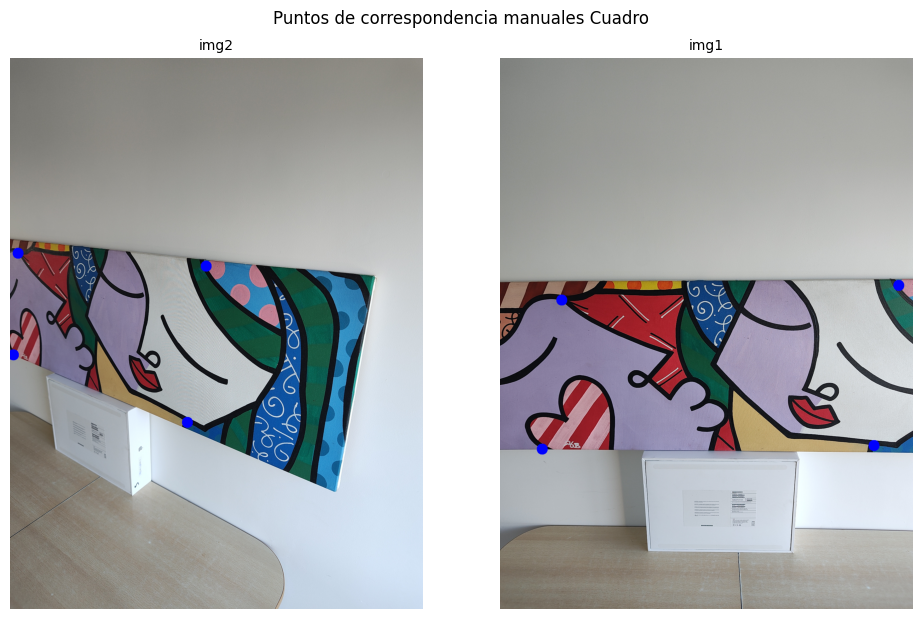

Homografía manual entre img2 y img1:
[[ 2.76274814e+00 -7.35469069e-02  1.91483089e+02]
 [ 3.93715355e-01  1.35359370e+00 -1.03842643e+02]
 [ 6.86053997e-04 -4.73486178e-05  1.00000000e+00]]


In [14]:
H_udesa_01_manual = show_manual_matches_and_compute_H(
    matches_manual_udesa_01,
    resize_factor_udesa,
    {0: img0_udesa, 1: img1_udesa},
    title_prefix="manuales Udesa"
)

H_udesa_21_manual = show_manual_matches_and_compute_H(
    matches_manual_udesa_21,
    resize_factor_udesa,
    {1: img1_udesa, 2: img2_udesa},
    title_prefix="manuales Udesa"
)

H_cuadro_01_manual = show_manual_matches_and_compute_H(
    matches_manual_cuadro_01,
    resize_factor_cuadro,
    {0: img0_cuadro, 1: img1_cuadro},
    title_prefix="manuales Cuadro"
)

H_cuadro_21_manual = show_manual_matches_and_compute_H(
    matches_manual_cuadro_21,
    resize_factor_cuadro,
    {1: img1_cuadro, 2: img2_cuadro},
    title_prefix="manuales Cuadro"
)

### Usamos las homografías del DLT de puntos manuales para armar panorámicas (para verificar si la homografía funciona correctamente)

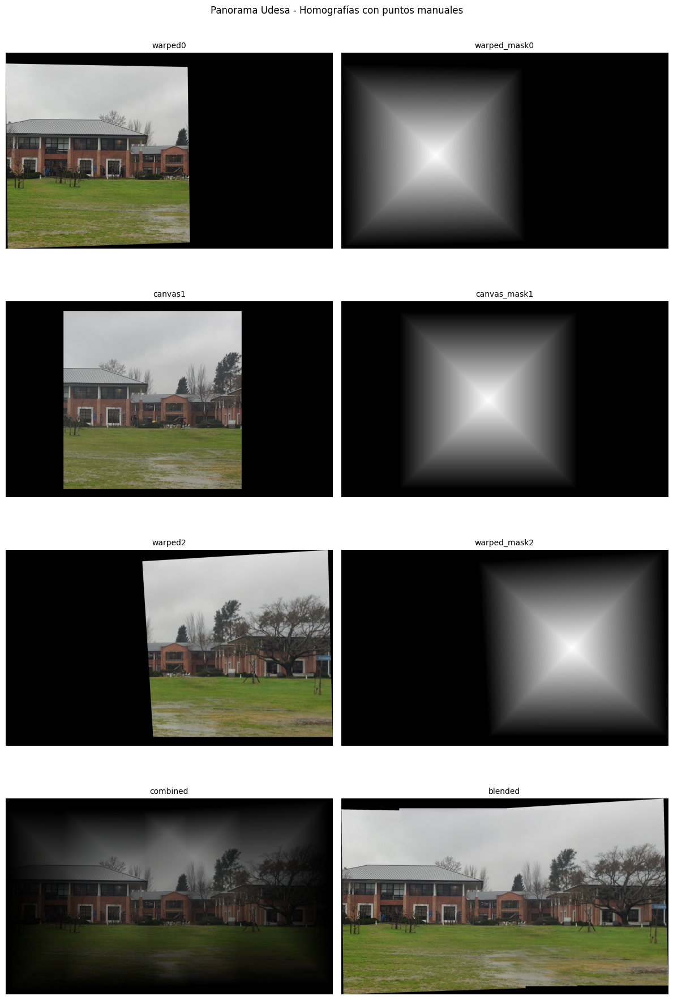

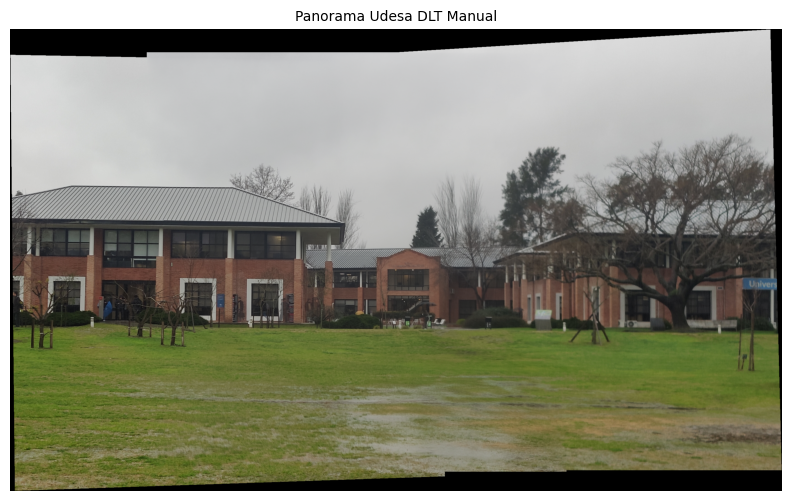

True

In [15]:
manual_udesa_imgs = stitch_images_with_blending(img0_udesa, img1_udesa, img2_udesa, H_udesa_01_manual, H_udesa_21_manual)

show_images(
    list(manual_udesa_imgs.values()),
    list(manual_udesa_imgs.keys()),
    grid=(4, 2),
    title="Panorama Udesa - Homografías con puntos manuales",
    figsize=(12, 18),
)

imshow(manual_udesa_imgs["blended"], title='Panorama Udesa DLT Manual', figsize=(12, 6))

cv2.imwrite("generated_imgs/panorama_udesa_(dlt_manual).jpg", manual_udesa_imgs["blended"])

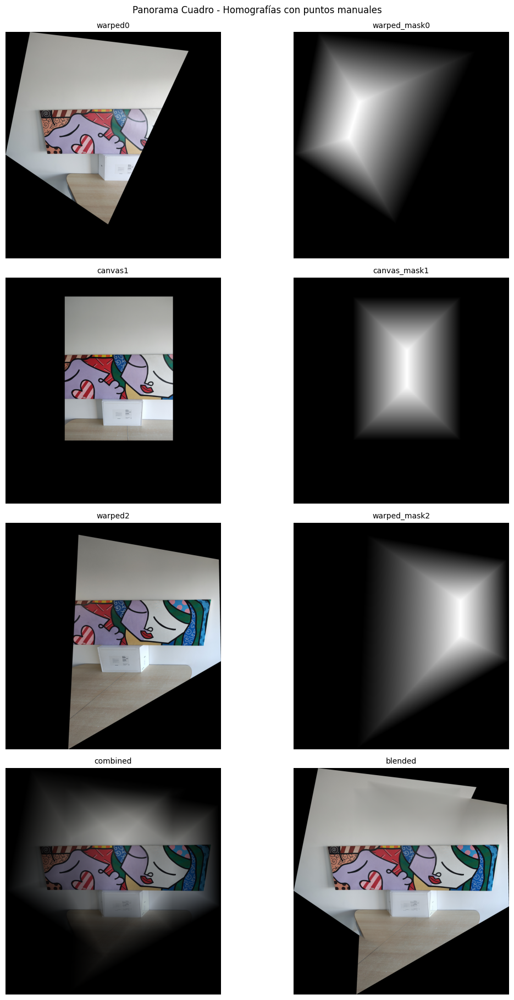

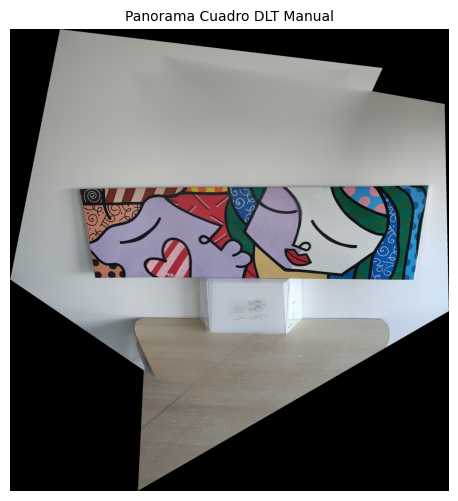

True

In [16]:
manual_cuadro_imgs = stitch_images_with_blending(img0_cuadro, img1_cuadro, img2_cuadro, H_cuadro_01_manual, H_cuadro_21_manual)

show_images(
    list(manual_cuadro_imgs.values()),
    list(manual_cuadro_imgs.keys()),
    grid=(4, 2),
    title="Panorama Cuadro - Homografías con puntos manuales",
    figsize=(12, 18),
)

imshow(manual_cuadro_imgs["blended"], title='Panorama Cuadro DLT Manual', figsize=(12, 6))

cv2.imwrite("generated_imgs/panorama_cuadro_(dlt_manual).jpg", manual_cuadro_imgs["blended"])

# 5) RANSAC + estimación algorítmica de homografías

## Aplicamos una implementación propia de RANSAC

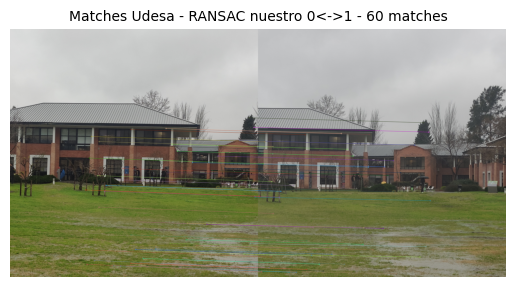

Matriz de homografía H – UDESA 0<->1:
[[ 1.04826023e+00  8.74340957e-03 -4.77805401e+02]
 [ 1.49360412e-02  1.02113970e+00  2.04837846e+01]
 [ 2.98026871e-05 -3.22902189e-06  1.00000000e+00]]


In [17]:
pts0 = np.float32([kp0_udesa[m.queryIdx].pt for m in matches_01_cross_y_lowe_udesa])
pts1 = np.float32([kp1_udesa[m.trainIdx].pt for m in matches_01_cross_y_lowe_udesa])

# RANSAC
H_udesa, inlier_mask_udesa = ransac_homography(pts0, pts1, num_iters=2000, threshold=5.0)

# Filtrar los matches inliers
inlier_matches_01_udesa = [m for m, keep in zip(matches_01_cross_y_lowe_udesa, inlier_mask_udesa) if keep]

# Visualizar
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, inlier_matches_01_udesa, title='Matches Udesa - RANSAC nuestro 0<->1')
print("Matriz de homografía H – UDESA 0<->1:")
print(H_udesa)

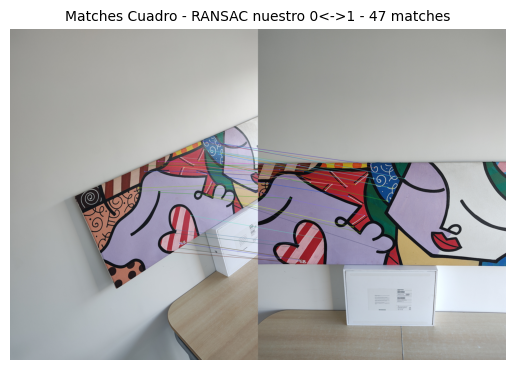

Matriz de homografía H – CUADRO:
[[ 1.08961680e+00 -2.80224038e-01 -5.24391604e+02]
 [ 2.20998580e-01  1.08235238e+00 -3.24463281e+02]
 [-2.34310400e-04  1.35682252e-04  1.00000000e+00]]


In [18]:
pts0 = np.float32([kp0_cuadro[m.queryIdx].pt for m in matches_01_cross_y_lowe_cuadro])
pts1 = np.float32([kp1_cuadro[m.trainIdx].pt for m in matches_01_cross_y_lowe_cuadro])

# Ransac (nuestra implementación)
H_cuadro, inlier_mask_cuadro = ransac_homography(pts0, pts1, num_iters=2000, threshold=5.0)

# Filtrar los matches inliers
inlier_matches_01_cuadro = [m for m, keep in zip(matches_01_cross_y_lowe_cuadro, inlier_mask_cuadro) if keep]

# Visualizar
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, inlier_matches_01_cuadro, title='Matches Cuadro - RANSAC nuestro 0<->1')
print("Matriz de homografía H – CUADRO:")
print(H_cuadro)


## Comparamos con el RANSAC de opencv para verificar

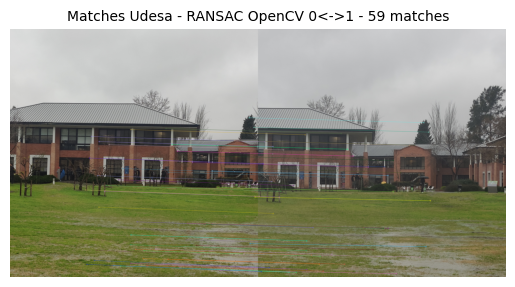

Matriz de homografía H (Ransac de OpenCV) - UDESA:
[[ 1.05913601e+00  1.00677759e-02 -4.85167693e+02]
 [ 1.93100052e-02  1.03258908e+00  1.24415651e+01]
 [ 3.38576338e-05  2.49287891e-08  1.00000000e+00]]


In [19]:
pts0_cv = np.float32([kp0_udesa[m.queryIdx].pt for m in matches_01_cross_y_lowe_udesa])
pts1_cv = np.float32([kp1_udesa[m.trainIdx].pt for m in matches_01_cross_y_lowe_udesa])

# Ransac de OpenCV
H_cv_udesa, mask_cv_udesa = cv2.findHomography(pts0_cv, pts1_cv, cv2.RANSAC, ransacReprojThreshold=5.0)

# Filtrar matches válidos (inliers)
inlier_matches_cv_udesa = [m for m, keep in zip(matches_01_cross_y_lowe_udesa, mask_cv_udesa.ravel()) if keep]

# Visualizar
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, inlier_matches_cv_udesa, title='Matches Udesa - RANSAC OpenCV 0<->1')
print("Matriz de homografía H (Ransac de OpenCV) - UDESA:")
print(H_cv_udesa)

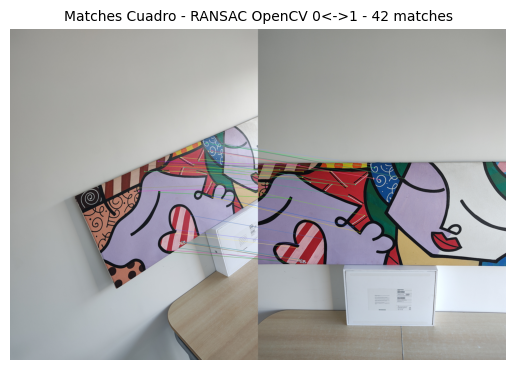

Matriz de homografía H (OpenCV) - CUADRO:
[[ 1.03905282e+00 -2.75135760e-01 -4.90548382e+02]
 [ 1.91434008e-01  1.02805921e+00 -2.77973564e+02]
 [-2.51390141e-04  1.18680178e-04  1.00000000e+00]]


In [20]:
pts0_cv_cuadro = np.float32([kp0_cuadro[m.queryIdx].pt for m in matches_01_cross_y_lowe_cuadro])
pts1_cv_cuadro = np.float32([kp1_cuadro[m.trainIdx].pt for m in matches_01_cross_y_lowe_cuadro])

# Ransac de OpenCV
H_cv_cuadro, mask_cv_cuadro = cv2.findHomography(pts0_cv_cuadro, pts1_cv_cuadro, cv2.RANSAC, ransacReprojThreshold=5.0)

# Filtrar matches válidos
inlier_matches_cv_cuadro = [m for m, keep in zip(matches_01_cross_y_lowe_cuadro, mask_cv_cuadro.ravel()) if keep]

# Visualizar
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, inlier_matches_cv_cuadro, title='Matches Cuadro - RANSAC OpenCV 0<->1')
print("Matriz de homografía H (OpenCV) - CUADRO:")
print(H_cv_cuadro)

# 6) Corremos todo el pipeline para obtener las panoramicas finales

Inliers 0-1: 49
Inliers 1-2: 23
Matriz de homografía H – Cuadro 0<->1:
[[ 1.08239066e+00 -2.82689887e-01 -5.15091012e+02]
 [ 2.21222712e-01  1.09454285e+00 -3.33500681e+02]
 [-2.39664455e-04  1.43542244e-04  1.00000000e+00]]
Matriz de homografía H – Cuadro 2<->1:
[[ 2.69442837e+00 -8.79326420e-02  2.00141526e+02]
 [ 3.84476040e-01  1.27553133e+00 -6.45951199e+01]
 [ 6.61358323e-04 -7.42106899e-05  1.00000000e+00]]


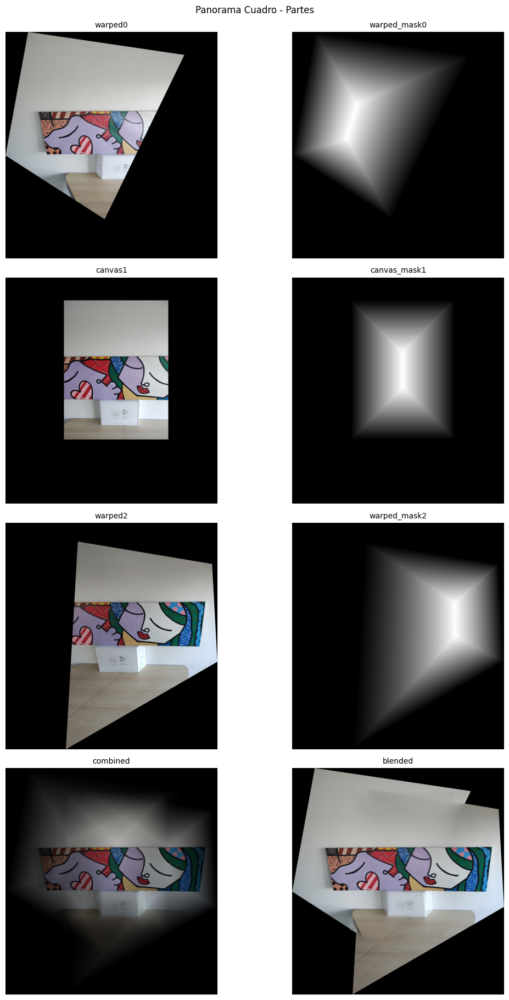

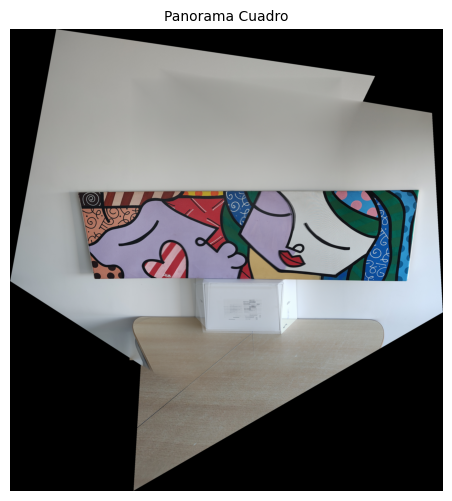

True

In [21]:
### Pipeline entero ###
kp0, desc0 = anms(*detect_features(gray0_cuadro), N=1000)
kp1, desc1 = anms(*detect_features(gray1_cuadro), N=1000)
kp2, desc2 = anms(*detect_features(gray2_cuadro), N=1000)

matches01 = match_descriptors(desc0, desc1, method="cross_check_and_lowe", ratio_thresh=0.8)
matches21 = match_descriptors(desc2, desc1, method="cross_check_and_lowe", ratio_thresh=0.9)

pts0 = np.float32([kp0[m.queryIdx].pt for m in matches01])
pts1_0 = np.float32([kp1[m.trainIdx].pt for m in matches01])
pts2 = np.float32([kp2[m.queryIdx].pt for m in matches21])
pts1_2 = np.float32([kp1[m.trainIdx].pt for m in matches21])

# Nota: Usamos nuestro ransac_homography solo para obtener los inliers, luego usamos cv2.findHomography() con RANSAC desactivado para computar H con todos los inliers
_, inlier_mask01 = ransac_homography(pts0, pts1_0, num_iters=2000, threshold=5.0)
pts0_inliers = pts0[inlier_mask01]
pts1_0_inliers = pts1_0[inlier_mask01]
H01, _ = cv2.findHomography(pts0_inliers, pts1_0_inliers, method=0)

_, inlier_mask12 = ransac_homography(pts2, pts1_2, num_iters=2000, threshold=5.0)
pts2_inliers = pts2[inlier_mask12]
pts1_2_inliers = pts1_2[inlier_mask12]
H12, _ = cv2.findHomography(pts2_inliers, pts1_2_inliers, method=0)

print(f"Inliers 0-1: {len(pts0_inliers)}")
print(f"Inliers 1-2: {len(pts2_inliers)}")

print("Matriz de homografía H – Cuadro 0<->1:")
print(H01)
print("Matriz de homografía H – Cuadro 2<->1:")
print(H12)

final_cuadro_imgs = stitch_images_with_blending(img0_cuadro, img1_cuadro, img2_cuadro, H01, H12)

show_images(
    list(final_cuadro_imgs.values()),
    list(final_cuadro_imgs.keys()),
    grid=(4, 2),
    title="Panorama Cuadro - Partes",
    figsize=(12, 18),
)


imshow(final_cuadro_imgs["blended"], title='Panorama Cuadro', figsize=(12, 6))

cv2.imwrite("generated_imgs/panorama_cuadro.jpg", final_cuadro_imgs["blended"])

Inliers 0-1: 101
Inliers 1-2: 25
Matriz de homografía H – UDESA 0<->1:
[[ 1.05745421e+00  1.03509954e-02 -4.84425728e+02]
 [ 1.91085262e-02  1.03119256e+00  1.33212718e+01]
 [ 3.37522638e-05 -5.93557697e-07  1.00000000e+00]]
Matriz de homografía H – UDESA 2<->1:
[[ 9.14155488e-01  5.13118195e-02  6.80072436e+02]
 [-7.25508258e-02  9.80937722e-01  3.70098205e+01]
 [-5.69493488e-05  9.11091879e-06  1.00000000e+00]]


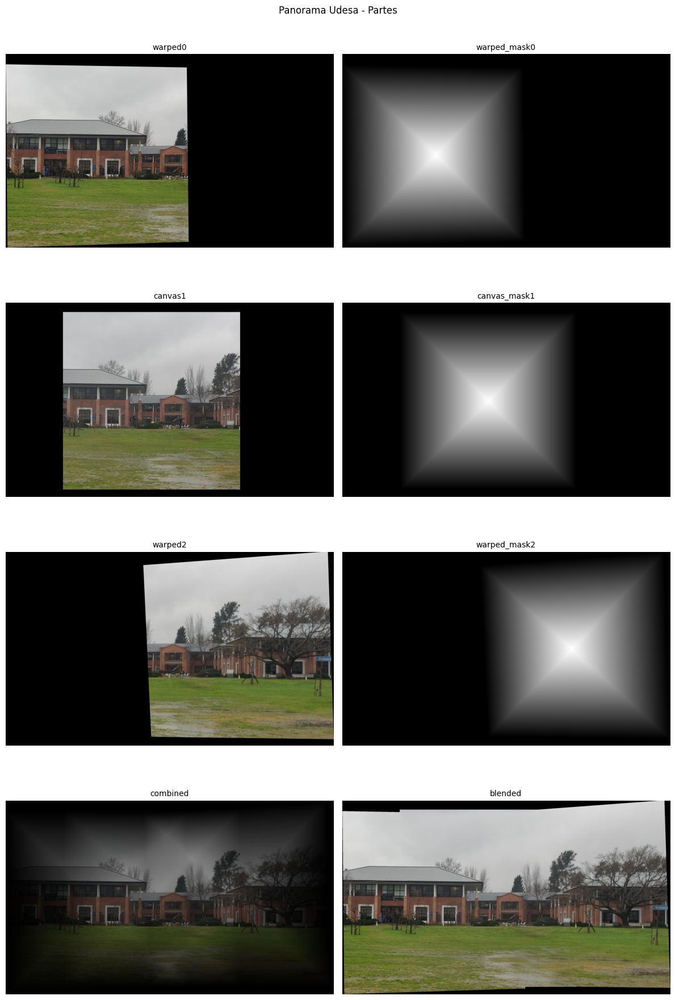

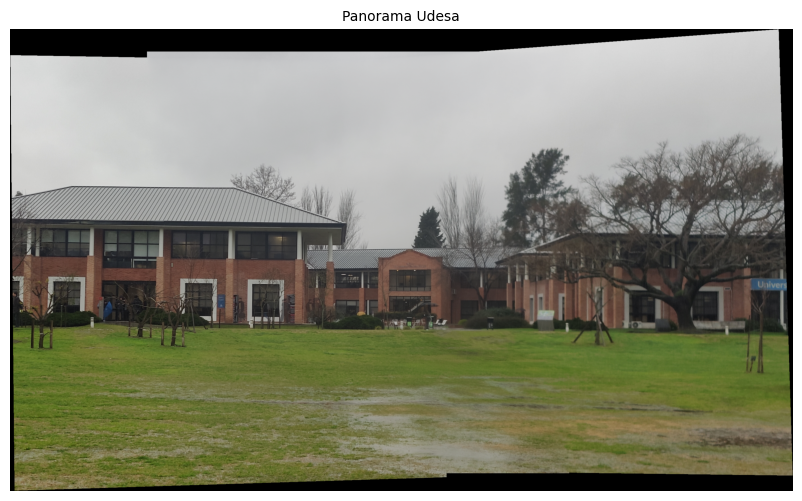

True

In [22]:
### Pipeline entero ###
kp0, desc0 = anms(*detect_features(gray0_udesa), N=1000)
kp1, desc1 = anms(*detect_features(gray1_udesa), N=1000)
kp2, desc2 = anms(*detect_features(gray2_udesa), N=1000)

matches01 = match_descriptors(desc0, desc1, method="cross_check_and_lowe")
matches21 = match_descriptors(desc2, desc1, method="cross_check_and_lowe")

pts0 = np.float32([kp0[m.queryIdx].pt for m in matches01])
pts1_0 = np.float32([kp1[m.trainIdx].pt for m in matches01])
pts2 = np.float32([kp2[m.queryIdx].pt for m in matches21])
pts1_2 = np.float32([kp1[m.trainIdx].pt for m in matches21])

# Nota: Usamos nuestro ransac_homography solo para obtener los inliers, luego usamos cv2.findHomography() con RANSAC desactivado para computar H con todos los inliers
_, inlier_mask01 = ransac_homography(pts0, pts1_0, num_iters=2000, threshold=5.0)
pts0_inliers = pts0[inlier_mask01]
pts1_0_inliers = pts1_0[inlier_mask01]
H01, _ = cv2.findHomography(pts0_inliers, pts1_0_inliers, method=0)

_, inlier_mask12 = ransac_homography(pts2, pts1_2, num_iters=2000, threshold=5.0)
pts2_inliers = pts2[inlier_mask12]
pts1_2_inliers = pts1_2[inlier_mask12]
H12, _ = cv2.findHomography(pts2_inliers, pts1_2_inliers, method=0)

print(f"Inliers 0-1: {len(pts0_inliers)}")
print(f"Inliers 1-2: {len(pts2_inliers)}")

print("Matriz de homografía H – UDESA 0<->1:")
print(H01)
print("Matriz de homografía H – UDESA 2<->1:")
print(H12)

final_udesa_imgs = stitch_images_with_blending(img0_udesa, img1_udesa, img2_udesa, H01, H12)

show_images(
    list(final_udesa_imgs.values()),
    list(final_udesa_imgs.keys()),
    grid=(4, 2),
    title="Panorama Udesa - Partes",
    figsize=(12, 18),
)

imshow(final_udesa_imgs["blended"], title='Panorama Udesa', figsize=(12, 6))

cv2.imwrite("generated_imgs/panorama_udesa.jpg", final_udesa_imgs["blended"])

## Con fotos nuestras

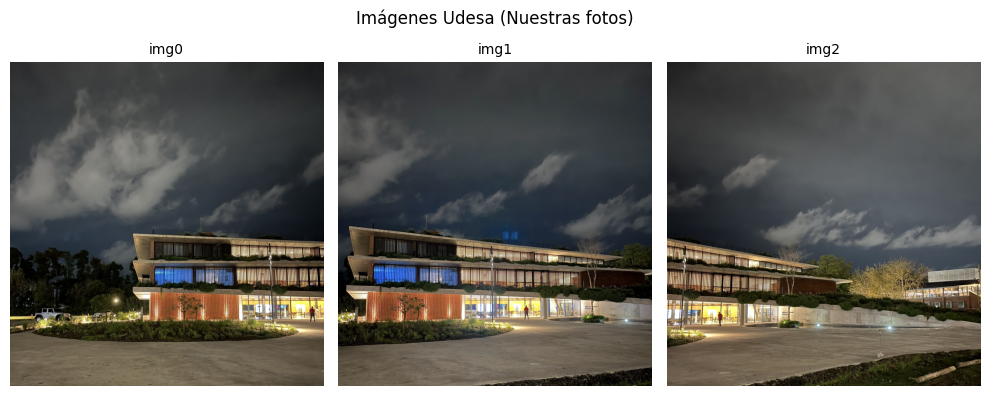

Matches cross check Lowe 0-1:  146
Matches cross check Lowe 1-2:  120
Inliers Ransac 0-1: 135
Inliers Ransac 1-2: 104
Matriz de homografía H – UDESA nuestra 0<->1:
[[ 1.47569886e+00 -5.57162808e-02 -7.57809801e+02]
 [ 3.52900395e-01  1.31672555e+00 -3.59004205e+02]
 [ 3.11577484e-04  1.01204886e-06  1.00000000e+00]]
Matriz de homografía H – UDESA nuestra 2<->1:
[[ 6.14373335e-01  5.48884047e-02  6.14065678e+02]
 [-2.92048304e-01  8.85944163e-01  1.09140634e+02]
 [-2.53012746e-04  1.57507296e-06  1.00000000e+00]]


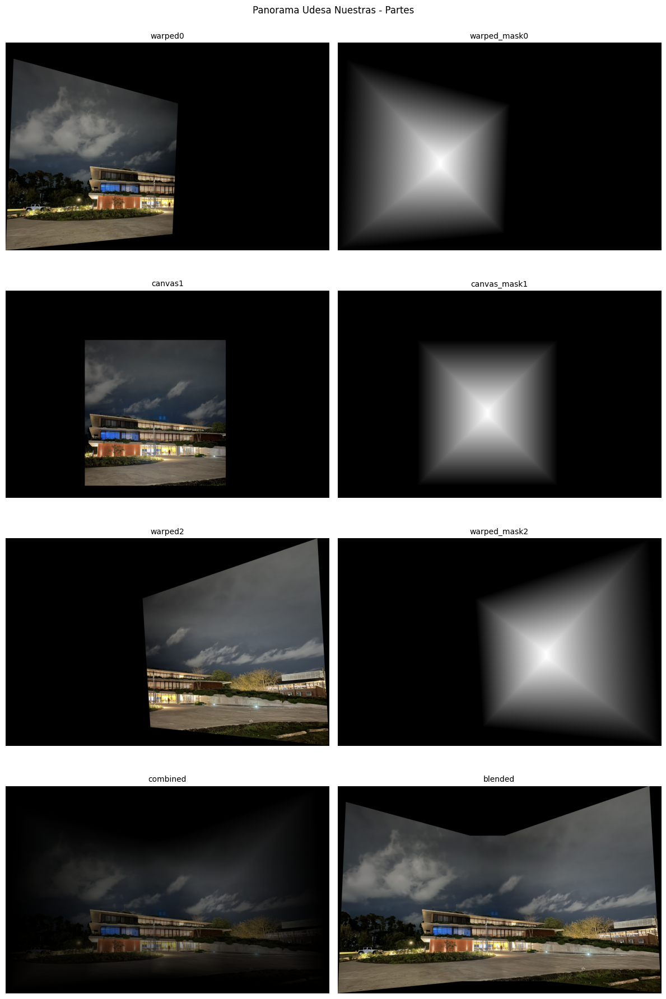

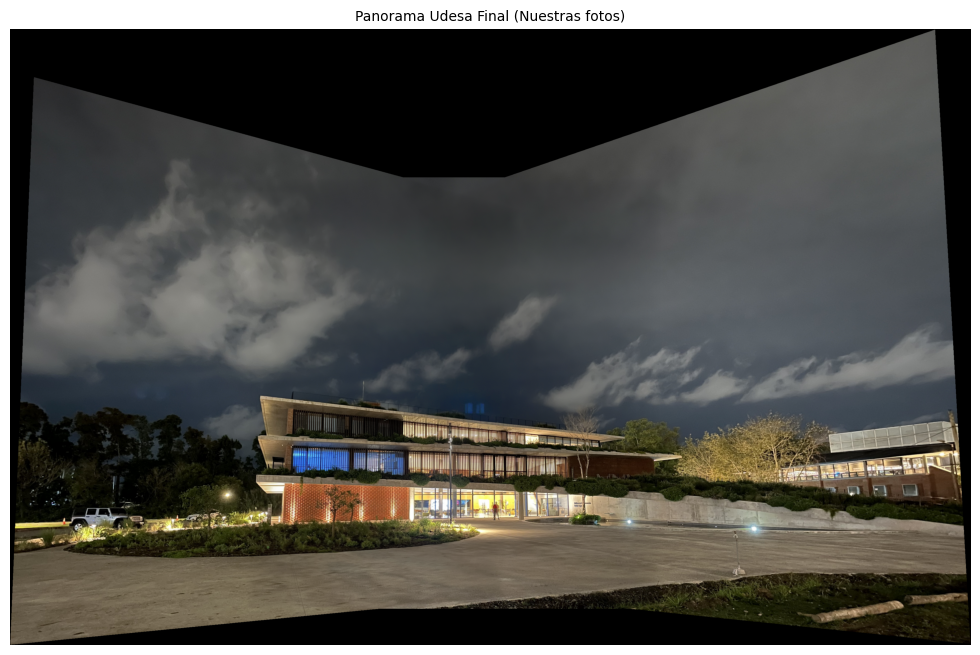

True

In [23]:
### Pipeline entero ###
images_color_udesa_nuestro, images_gray_udesa_nuestro, resize_factors_udesa_nuestro = load_images_from_folder("img_nuestras", target_width=1500)

img0_udesa_nuestro, img1_udesa_nuestro, img2_udesa_nuestro = images_color_udesa_nuestro
gray0_udesa_nuestro, gray1_udesa_nuestro, gray2_udesa_nuestro = images_gray_udesa_nuestro
resize_factor_udesa_nuestro = resize_factors_udesa_nuestro
show_images([img0_udesa_nuestro, img1_udesa_nuestro, img2_udesa_nuestro], ['img0', 'img1', 'img2'], title='Imágenes Udesa (Nuestras fotos)')

kp0, desc0 = anms(*detect_features(gray0_udesa_nuestro), N=1000)
kp1, desc1 = anms(*detect_features(gray1_udesa_nuestro), N=1000)
kp2, desc2 = anms(*detect_features(gray2_udesa_nuestro), N=1000)

matches01 = match_descriptors(desc0, desc1, method="cross_check_and_lowe")
matches21 = match_descriptors(desc2, desc1, method="cross_check_and_lowe")

print("Matches cross check Lowe 0-1: ", len(matches01))
print("Matches cross check Lowe 1-2: ", len(matches21))

pts0 = np.float32([kp0[m.queryIdx].pt for m in matches01])
pts1_0 = np.float32([kp1[m.trainIdx].pt for m in matches01])
pts2 = np.float32([kp2[m.queryIdx].pt for m in matches21])
pts1_2 = np.float32([kp1[m.trainIdx].pt for m in matches21])

# Nota: Usamos nuestro ransac_homography solo para obtener los inliers, luego usamos cv2.findHomography() con RANSAC desactivado para computar H con todos los inliers
_, inlier_mask01 = ransac_homography(pts0, pts1_0, num_iters=2000, threshold=5.0)
pts0_inliers = pts0[inlier_mask01]
pts1_0_inliers = pts1_0[inlier_mask01]
H01, _ = cv2.findHomography(pts0_inliers, pts1_0_inliers, method=0)

_, inlier_mask12 = ransac_homography(pts2, pts1_2, num_iters=2000, threshold=5.0)
pts2_inliers = pts2[inlier_mask12]
pts1_2_inliers = pts1_2[inlier_mask12]
H12, _ = cv2.findHomography(pts2_inliers, pts1_2_inliers, method=0)

print(f"Inliers Ransac 0-1: {len(pts0_inliers)}")
print(f"Inliers Ransac 1-2: {len(pts2_inliers)}")

print("Matriz de homografía H – UDESA nuestra 0<->1:")
print(H01)
print("Matriz de homografía H – UDESA nuestra 2<->1:")
print(H12)

final_sullair_imgs = stitch_images_with_blending(img0_udesa_nuestro, img1_udesa_nuestro, img2_udesa_nuestro, H01, H12)

show_images(
    list(final_sullair_imgs.values()),
    list(final_sullair_imgs.keys()),
    grid=(4, 2),
    title="Panorama Udesa Nuestras - Partes",
    figsize=(12, 18),
)

imshow(final_sullair_imgs["blended"], title='Panorama Udesa Final (Nuestras fotos)', figsize=(16, 8))

cv2.imwrite("generated_imgs/panorama_sullair.jpg", final_sullair_imgs["blended"])